## Handle Downloaded data files and organize them

Folder Structure is as follows:
```yaml
data/REFINED DATASETS  
│   camel.v1i.yolo26.zip  
│   Cheetah.v1i.yolo26.zip  
│   dogs and cats.v1i.yolo26.zip  
│   hyena.v2i.yolo26.zip  
│   leopard.v2i.yolo26.zip  
│   Nubian Ibex Finder.v3i.yolo26.zip  
│
└───Negative Samples
```


In [4]:
import os
import shutil
from ultralytics import YOLO

In [ ]:
# Loop through every zip file (in data/Refined Datasets/zip) 
# Remove the ".yolo26" part from the zip file name to create a folder with the same name as the zip file
# and extract it to a data/Refined Datasets folder with the same name as the zip file (without ".yolo26.zip" part)
# After extracting, display the number of images in each folder and the number of images in total


# total_images = 0

for file in os.listdir("../data/Refined Datasets/zip"):
    if file.endswith(".zip"):
        folder_name = file.replace(".yolo26.zip", "")
        folder_path = os.path.join("../data/Refined Datasets", folder_name)
        os.makedirs(folder_path, exist_ok=True)
        shutil.unpack_archive(os.path.join("../data/Refined Datasets/zip", file), folder_path)
        
        # total_images += image_count

        print(f"Extracted {file} to {folder_path}")
# print(f"Total number of images extracted: {total_images}")


Extracted Arabian Gazells.yolo26.zip to Refined Datasets\Arabian Gazells
Extracted camel.v1i.yolo26.zip to Refined Datasets\camel.v1i
Extracted Caracal.v1i.yolo26.zip to Refined Datasets\Caracal.v1i
Extracted Cheetah.v1i.yolo26.zip to Refined Datasets\Cheetah.v1i
Extracted dogs and cats.v1i.yolo26.zip to Refined Datasets\dogs and cats.v1i
Extracted hyena.v2i.yolo26.zip to Refined Datasets\hyena.v2i
Extracted leopard.v2i.yolo26.zip to Refined Datasets\leopard.v2i
Extracted Nubian Ibex Finder.v3i.yolo26.zip to Refined Datasets\Nubian Ibex Finder.v3i
Extracted people.v3i.yolo26.zip to Refined Datasets\people.v3i


In [ ]:
# count the number of images in each folder and the number of images in total (go recursively through all folders in Refined Datasets)
# until it reaches the end of the folder structure and then display the number of images in each folder and the number of images in total

#folder names are:
# Arabian Gazells
# camel.v1i
# Caracal.v1i
# Cheetah.v1i
# dogs and cats.v1i
# hyena.v2i
# leopard.v2i
# Nubian Ibex Finder.v3i

#group them by folder (so Arabian Gazells for example will has different images under train/test/val folders)
# combine them under their parent folder (so Arabian Gazells will have the number of all images under train/test/val folders combined)

total_images = 0
for root, dirs, files in os.walk("../data/Refined Datasets"):
    num_images = len([f for f in files if f.lower().endswith(('.png', '.jpg', '.jpeg','webp'))])
    total_images += num_images
    if num_images > 0:
        print(f"Folder: {root} - Number of images: {num_images}")

print(f"Total number of images in all folders: {total_images}")


Folder: Refined Datasets\Arabian Gazells\test\images - Number of images: 23
Folder: Refined Datasets\Arabian Gazells\train\images - Number of images: 182
Folder: Refined Datasets\Arabian Gazells\valid\images - Number of images: 22
Folder: Refined Datasets\camel.v1i\test\images - Number of images: 11
Folder: Refined Datasets\camel.v1i\train\images - Number of images: 210
Folder: Refined Datasets\camel.v1i\valid\images - Number of images: 20
Folder: Refined Datasets\Caracal.v1i\train\images - Number of images: 350
Folder: Refined Datasets\Cheetah.v1i\test\images - Number of images: 51
Folder: Refined Datasets\Cheetah.v1i\train\images - Number of images: 1030
Folder: Refined Datasets\Cheetah.v1i\valid\images - Number of images: 102
Folder: Refined Datasets\dogs and cats.v1i\train\images - Number of images: 1554
Folder: Refined Datasets\dogs and cats.v1i\valid\images - Number of images: 129
Folder: Refined Datasets\hyena.v2i\train\images - Number of images: 381
Folder: Refined Datasets\hye

In [ ]:
import os

DRY_RUN = False  # check the printed plan first, then set False

ROOT_DIR = "../data/Refined Datasets"
IMAGE_EXTENSIONS = ('.png', '.jpg', '.jpeg', '.webp')

def sanitize(name):
    # make a folder name filesystem/filename-safe: spaces/dots -> underscores, lowercase
    return name.strip().lower().replace(" ", "_").replace(".", "_")

total_renamed = 0
per_class_counts = {}

for root, dirs, files in os.walk(ROOT_DIR):
    if os.path.basename(root) != "images":
        continue  # only trigger on an images/ folder, then locate its sibling labels/

    labels_dir = os.path.join(os.path.dirname(root), "labels")
    if not os.path.isdir(labels_dir):
        print(f"Warning: no labels/ sibling for {root}, skipping")
        continue

    # class name = top-level folder under ROOT_DIR (e.g. "Cheetah.v1i" or "Negative samples")
    rel_path = os.path.relpath(root, ROOT_DIR)
    parts = rel_path.split(os.sep)
    class_name = sanitize(parts[0])

    # split name = the folder directly above "images" (e.g. train/valid/test), if present
    split_name = sanitize(parts[-2]) if len(parts) >= 2 and parts[-2] != parts[0] else "all"

    image_files = sorted(f for f in files if f.lower().endswith(IMAGE_EXTENSIONS))

    count = 0
    for i, old_image_name in enumerate(image_files, start=1):
        stem, ext = os.path.splitext(old_image_name)
        old_image_path = os.path.join(root, old_image_name)
        old_label_path = os.path.join(labels_dir, stem + ".txt")

        new_stem = f"{class_name}_{split_name}_{i:04d}"
        new_image_path = os.path.join(root, new_stem + ext)
        new_label_path = os.path.join(labels_dir, new_stem + ".txt")

        if DRY_RUN:
            print(f"  {old_image_path} -> {new_image_path}")
            if os.path.exists(old_label_path):
                print(f"  {old_label_path} -> {new_label_path}")
            else:
                print(f"  Warning: no label found for {old_image_path}")
        else:
            os.rename(old_image_path, new_image_path)
            if os.path.exists(old_label_path):
                os.rename(old_label_path, new_label_path)
            else:
                print(f"  Warning: no label found for {old_image_path}")

        count += 1
        total_renamed += 1

    per_class_counts[rel_path] = count
    print(f"{rel_path}: {count} image/label pairs renamed to {class_name}_{split_name}_####")

print("\n--- Summary ---")
for folder, count in per_class_counts.items():
    print(f"  {folder}: {count}")
print(f"Total files renamed: {total_renamed}")
if DRY_RUN:
    print("\nDry run — nothing actually renamed. Set DRY_RUN = False to apply.")

Arabian Gazells\test\images: 23 image/label pairs renamed to arabian_gazells_test_####
Arabian Gazells\train\images: 182 image/label pairs renamed to arabian_gazells_train_####
Arabian Gazells\valid\images: 22 image/label pairs renamed to arabian_gazells_valid_####
camel.v1i\test\images: 11 image/label pairs renamed to camel_v1i_test_####
camel.v1i\train\images: 210 image/label pairs renamed to camel_v1i_train_####
camel.v1i\valid\images: 20 image/label pairs renamed to camel_v1i_valid_####
Caracal.v1i\train\images: 350 image/label pairs renamed to caracal_v1i_train_####
Cheetah.v1i\test\images: 51 image/label pairs renamed to cheetah_v1i_test_####
Cheetah.v1i\train\images: 1030 image/label pairs renamed to cheetah_v1i_train_####
Cheetah.v1i\valid\images: 102 image/label pairs renamed to cheetah_v1i_valid_####
dogs and cats.v1i\train\images: 1554 image/label pairs renamed to dogs_and_cats_v1i_train_####
dogs and cats.v1i\valid\images: 129 image/label pairs renamed to dogs_and_cats_v1i_

In [ ]:
import random
import os
from collections import defaultdict

DRY_RUN = False   # run once like this, check the summary, then flip to False

random.seed(42)

ROOT_DIR = "../data/Refined Datasets"
IMAGE_EXTENSIONS = ('.png', '.jpg', '.jpeg', '.webp')
MAX_PER_CLASS = 200
UNCAPPED_KEYWORDS = ["negative samples", "cheetah"]

class_groups = defaultdict(list)
for root, dirs, files in os.walk(ROOT_DIR):
    if os.path.basename(root) != "images":
        continue
    rel_path = os.path.relpath(root, ROOT_DIR)
    class_name = rel_path.split(os.sep)[0]
    class_groups[class_name].append(root)

total_deleted_images = 0
total_deleted_labels = 0

for class_name, images_dirs in class_groups.items():

    if any(k in class_name.lower() for k in UNCAPPED_KEYWORDS):
        print(f"{class_name}: excluded, left untouched.")
        continue

    all_images = []
    for images_dir in images_dirs:
        for f in os.listdir(images_dir):
            if f.lower().endswith(IMAGE_EXTENSIONS):
                all_images.append((images_dir, f))

    total_count = len(all_images)
    if total_count <= MAX_PER_CLASS:
        print(f"{class_name}: {total_count} images (<= cap), left as is.")
        continue

    selected = set(random.sample(all_images, MAX_PER_CLASS))
    deleted_in_this_class = 0

    for images_dir, image_file in all_images:
        if (images_dir, image_file) in selected:
            continue

        labels_dir = os.path.join(os.path.dirname(images_dir), "labels")
        image_path = os.path.join(images_dir, image_file)
        label_path = os.path.join(labels_dir, os.path.splitext(image_file)[0] + ".txt")

        if not DRY_RUN:
            os.remove(image_path)
            total_deleted_images += 1
            if os.path.exists(label_path):
                os.remove(label_path)
                total_deleted_labels += 1
        deleted_in_this_class += 1

    print(f"{class_name}: {total_count} -> kept {MAX_PER_CLASS}, removed {deleted_in_this_class}")

print("\n--- Summary ---")
if DRY_RUN:
    print("Dry run — no files deleted. Set DRY_RUN = False to actually delete.")
else:
    print(f"Total images deleted: {total_deleted_images}")
    print(f"Total label files deleted: {total_deleted_labels}")

Arabian Gazells: 227 -> kept 200, removed 27
camel.v1i: 241 -> kept 200, removed 41
Caracal.v1i: 350 -> kept 200, removed 150
Cheetah.v1i: excluded, left untouched.
dogs and cats.v1i: 1683 -> kept 200, removed 1483
hyena.v2i: 401 -> kept 200, removed 201
leopard.v2i: 1141 -> kept 200, removed 941
Nubian Ibex Finder.v3i: 1759 -> kept 200, removed 1559
people.v3i: 175 images (<= cap), left as is.

--- Summary ---
Total images deleted: 4402
Total label files deleted: 4402


### Plot some images with their labels to see

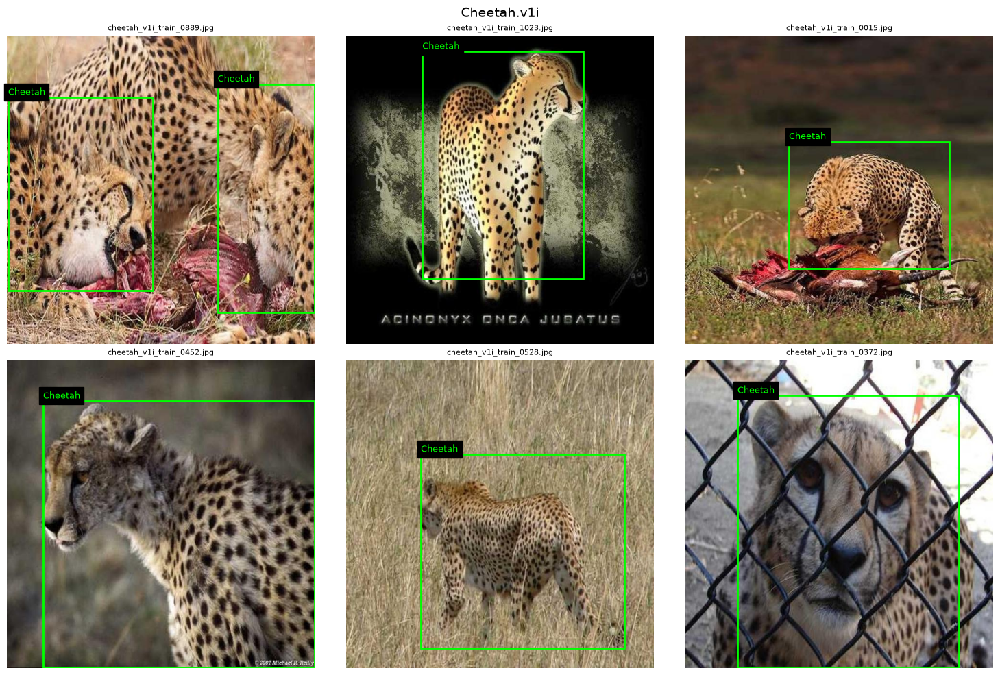

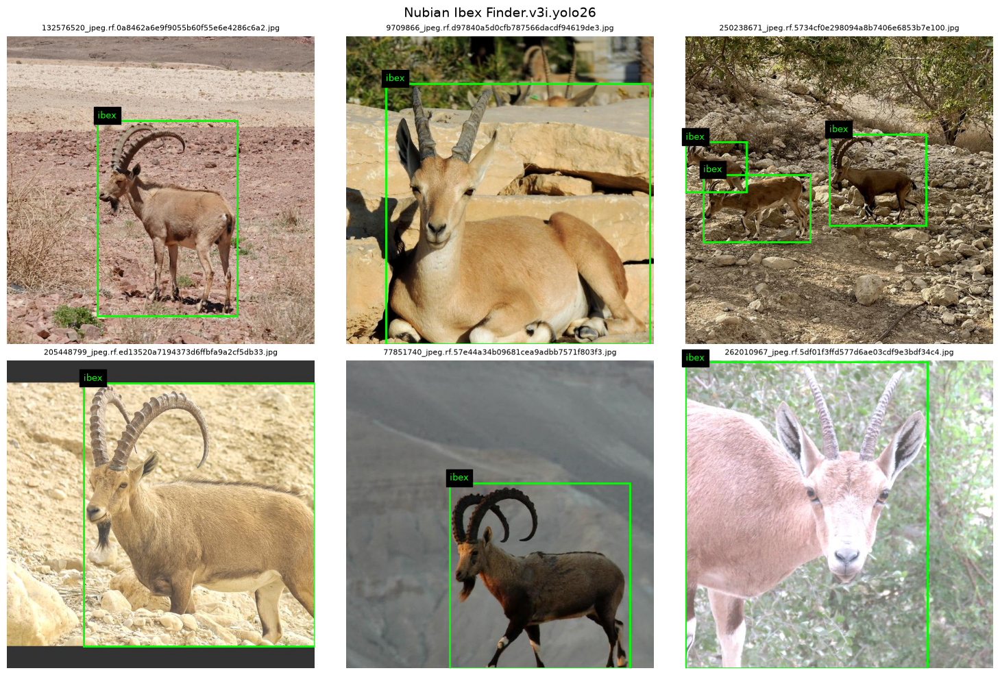

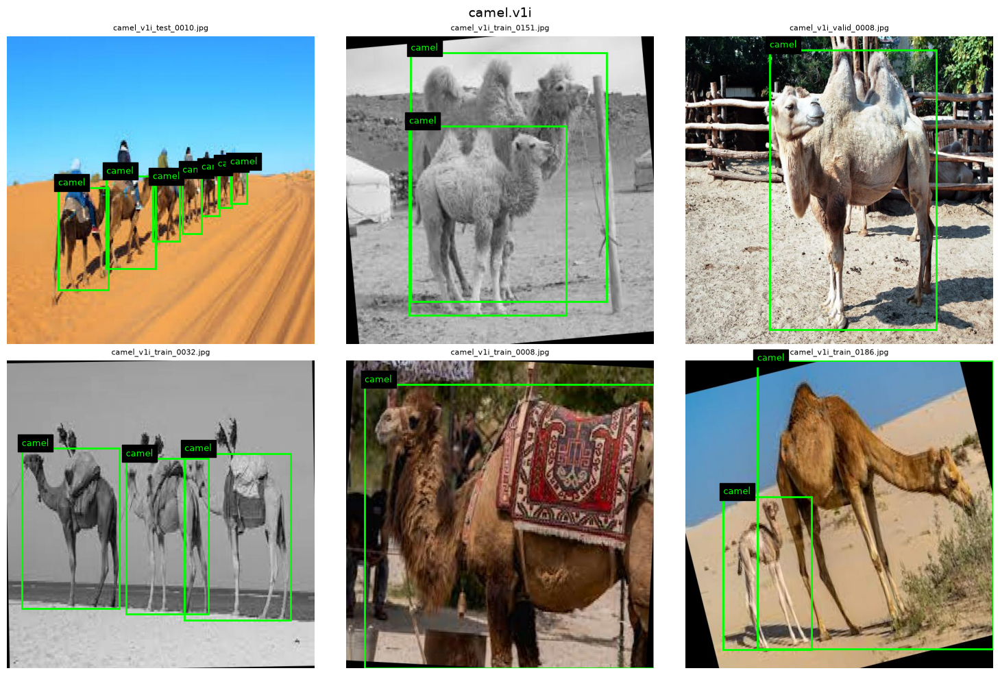

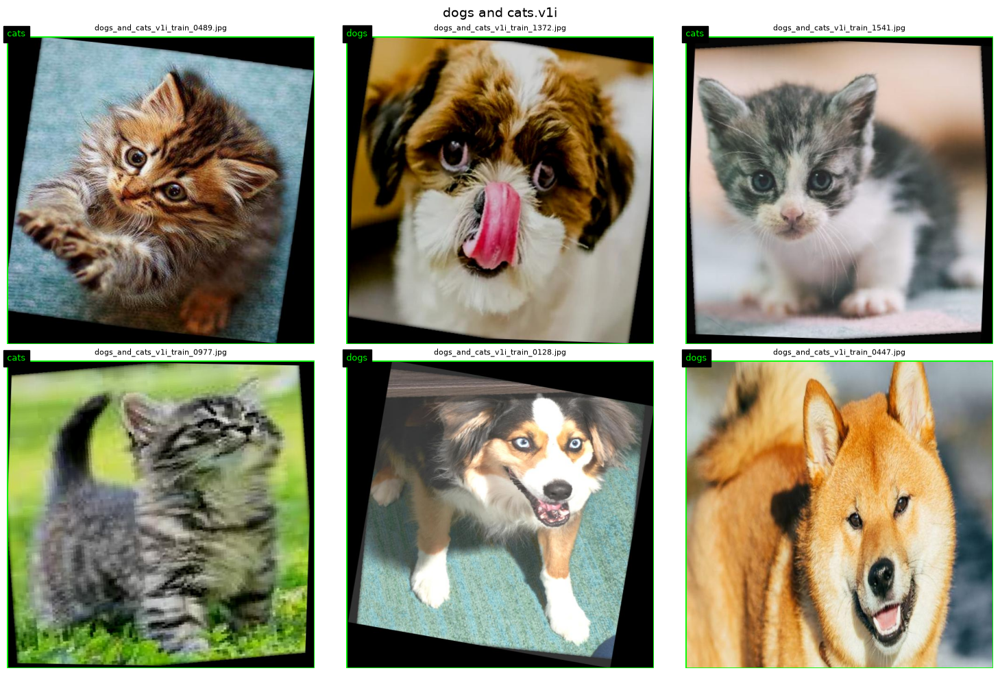

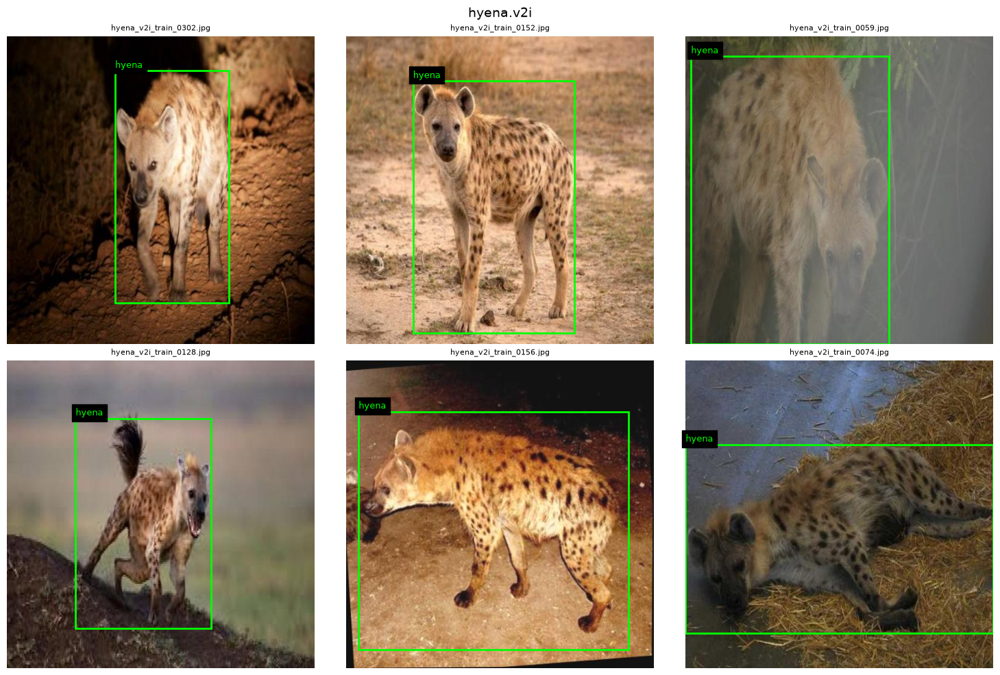

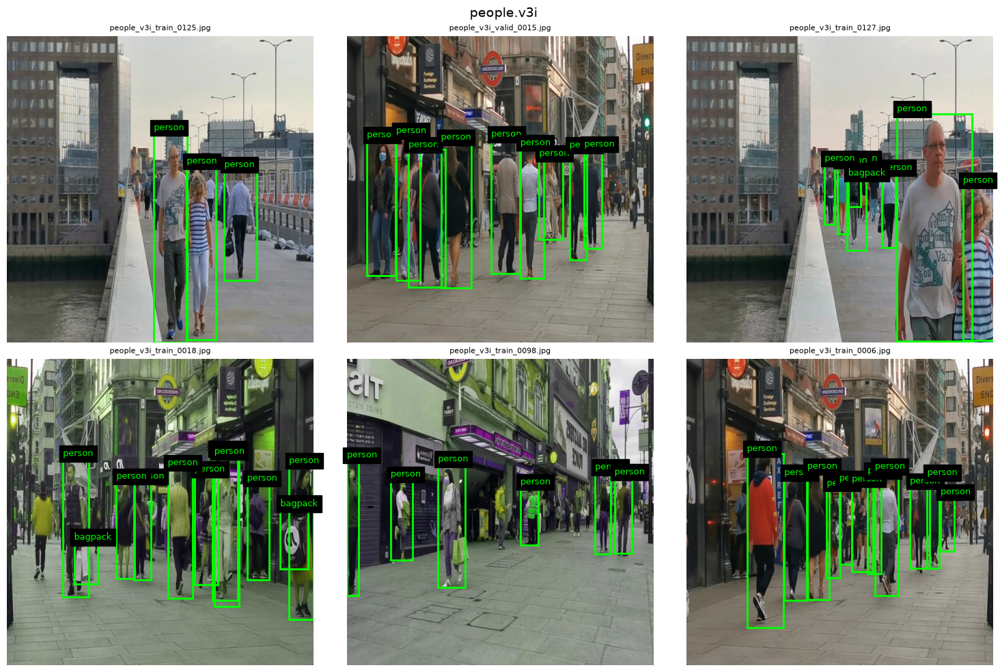

In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image, ImageOps

ROOT_DIR = "../data/Refined Datasets"
EXCLUDE_FOLDERS = ["leopard.v2i", "zip", "Arabian Gazells", "Negative Samples"]
IMAGE_EXTENSIONS = ('.png', '.jpg', '.jpeg', '.webp')
SAMPLES_PER_CLASS = 6

random.seed(40)

def find_images_dirs(class_folder):
    """Return all images/ dirs under a class folder (across train/valid/test)."""
    found = []
    for root, dirs, files in os.walk(os.path.join(ROOT_DIR, class_folder)):
        if os.path.basename(root) == "images":
            found.append(root)
    return found

def parse_data_yaml_names(folder_path):
    """Get the local class names list (index = local class id) from this folder's data.yaml."""
    yaml_path = os.path.join(folder_path, "data.yaml")
    if not os.path.exists(yaml_path):
        return None
    with open(yaml_path, "r") as f:
        content = f.read()
    for line in content.splitlines():
        line = line.strip()
        if line.startswith("names:"):
            list_str = line.split("names:")[1].strip()
            return eval(list_str)
    return None

def load_yolo_boxes(label_path):
    boxes = []
    if not os.path.exists(label_path):
        return boxes
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls, xc, yc, w, h = parts[:5]
            boxes.append((int(cls), float(xc), float(yc), float(w), float(h)))
    return boxes

def load_image_corrected(img_path):
    """Open an image and bake in EXIF rotation, so displayed pixels match label coordinates."""
    img = Image.open(img_path)
    img = ImageOps.exif_transpose(img)
    return img

def plot_class_samples(class_folder):
    local_names = parse_data_yaml_names(os.path.join(ROOT_DIR, class_folder))

    images_dirs = find_images_dirs(class_folder)
    all_pairs = []
    for images_dir in images_dirs:
        labels_dir = os.path.join(os.path.dirname(images_dir), "labels")
        for f in os.listdir(images_dir):
            if f.lower().endswith(IMAGE_EXTENSIONS):
                all_pairs.append((images_dir, labels_dir, f))

    if not all_pairs:
        print(f"No images found for {class_folder}, skipping.")
        return

    sample = random.sample(all_pairs, min(SAMPLES_PER_CLASS, len(all_pairs)))

    cols = 3
    rows = (len(sample) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten() if len(sample) > 1 else [axes]

    for ax, (images_dir, labels_dir, fname) in zip(axes, sample):
        img_path = os.path.join(images_dir, fname)
        label_path = os.path.join(labels_dir, os.path.splitext(fname)[0] + ".txt")

        img = load_image_corrected(img_path)  # <-- EXIF-corrected load
        w, h = img.size
        ax.imshow(img)

        boxes = load_yolo_boxes(label_path)
        for cls, xc, yc, bw, bh in boxes:
            x0 = (xc - bw / 2) * w
            y0 = (yc - bh / 2) * h
            box_w = bw * w
            box_h = bh * h
            rect = patches.Rectangle((x0, y0), box_w, box_h,
                                      linewidth=2, edgecolor='lime', facecolor='none')
            ax.add_patch(rect)

            label_text = local_names[cls] if local_names else f"cls {cls}"
            ax.text(x0, max(y0 - 5, 0), label_text, color='lime', fontsize=9,
                     backgroundcolor='black')

        ax.set_title(fname, fontsize=8)
        ax.axis('off')

    for ax in axes[len(sample):]:
        ax.axis('off')

    fig.suptitle(class_folder, fontsize=14)
    plt.tight_layout()
    plt.show()

# ---- run for every class folder ----
class_folders = [
    d for d in os.listdir(ROOT_DIR)
    if os.path.isdir(os.path.join(ROOT_DIR, d)) and d not in EXCLUDE_FOLDERS
]

for class_folder in sorted(class_folders):
    plot_class_samples(class_folder)

## Merge Script 
put The different Datasets into a specific folder **(data/v2_yolo_dataset)**

#### Backup first

In [ ]:
import shutil

# copies the whole leopard dataset to a backup location first — pure safety net
shutil.copytree("data/v1_yolo_dataset", "data/v1_yolo_dataset_BACKUP")
print("Backup created.")

Backup created.


### Run Merge Script

In [ ]:
import os
import random
import shutil
from PIL import Image, ImageOps
from tqdm import tqdm

random.seed(42)

REFINED_DIR = "../data/Refined Datasets"
LEOPARD_DIR = "../data/v1_yolo_dataset"
NEGATIVES_DIR = os.path.join(REFINED_DIR, "Negative Samples")
OUTPUT_DIR = "../data/v2_yolo_dataset"
IMAGE_EXTENSIONS = ('.png', '.jpg', '.jpeg', '.webp')
SPLITS = ["train", "valid", "test"]

# caracal removed — dropped due to bad source annotations
GLOBAL_CLASSES = [
    "leopard", "cheetah", "hyena", "nubian_ibex",
    "camel", "cat", "dog", "person"
]
GLOBAL_ID = {name: i for i, name in enumerate(GLOBAL_CLASSES)}

CLASS_MAPPING = {
    "Cheetah.v1i":                    {"Cheetah": "cheetah"},
    "hyena.v2i":                      {"hyena": "hyena"},
    "Nubian Ibex Finder.v3i.yolo26":  {"ibex": "nubian_ibex"},
    "camel.v1i":                      {"camel": "camel"},
    "dogs and cats.v1i":              {"cats": "cat", "dogs": "dog"},
    "people.v3i":                     {"bagpack": None, "person": "person"},
}

# ---------- helpers ----------

def parse_data_yaml_names(folder_path):
    yaml_path = os.path.join(folder_path, "data.yaml")
    with open(yaml_path, "r") as f:
        content = f.read()
    for line in content.splitlines():
        line = line.strip()
        if line.startswith("names:"):
            list_str = line.split("names:")[1].strip()
            return eval(list_str)
    raise ValueError(f"Could not find names: in {yaml_path}")

def find_images_dirs(folder_path):
    dirs = {}
    for split in SPLITS:
        candidate = os.path.join(folder_path, split, "images")
        if os.path.isdir(candidate):
            dirs[split] = candidate
    return dirs

def copy_image_exif_safe(src_path, dst_path):
    img = Image.open(src_path)
    img = ImageOps.exif_transpose(img)
    img.save(dst_path)

def ensure_output_dirs():
    for split in SPLITS:
        os.makedirs(os.path.join(OUTPUT_DIR, split, "images"), exist_ok=True)
        os.makedirs(os.path.join(OUTPUT_DIR, split, "labels"), exist_ok=True)

# ---------- mapped-class merge ----------

LOCAL_NAMES_CACHE = {}

def merge_folder(folder_name, images_dirs, local_to_global, prefix):
    stats = {"copied": 0, "dropped_empty": 0}

    for split, images_dir in images_dirs.items():
        labels_dir = os.path.join(os.path.dirname(images_dir), "labels")
        out_images_dir = os.path.join(OUTPUT_DIR, split, "images")
        out_labels_dir = os.path.join(OUTPUT_DIR, split, "labels")

        fnames = [f for f in os.listdir(images_dir) if f.lower().endswith(IMAGE_EXTENSIONS)]

        for fname in tqdm(fnames, desc=f"{folder_name} [{split}]", unit="img"):
            stem, ext = os.path.splitext(fname)
            label_path = os.path.join(labels_dir, stem + ".txt")

            kept_lines = []
            if os.path.exists(label_path):
                with open(label_path, "r") as f:
                    for line in f:
                        parts = line.strip().split()
                        if len(parts) < 5:
                            continue
                        local_id = int(parts[0])
                        local_name = LOCAL_NAMES_CACHE[folder_name][local_id]
                        global_name = local_to_global.get(local_name)
                        if global_name is None:
                            continue
                        kept_lines.append(f"{GLOBAL_ID[global_name]} {' '.join(parts[1:])}")

            if not kept_lines:
                stats["dropped_empty"] += 1
                continue

            new_stem = f"{prefix}_{split}_{stem}"
            copy_image_exif_safe(os.path.join(images_dir, fname),
                                  os.path.join(out_images_dir, new_stem + ext))
            with open(os.path.join(out_labels_dir, new_stem + ".txt"), "w") as f:
                f.write("\n".join(kept_lines) + "\n")
            stats["copied"] += 1
    return stats

# ---------- leopard merge (already class 0) ----------

def merge_leopard(leopard_dir, prefix="leopard"):
    stats = {"copied": 0}
    images_dirs = find_images_dirs(leopard_dir)
    for split, images_dir in images_dirs.items():
        labels_dir = os.path.join(os.path.dirname(images_dir), "labels")
        out_images_dir = os.path.join(OUTPUT_DIR, split, "images")
        out_labels_dir = os.path.join(OUTPUT_DIR, split, "labels")

        fnames = [f for f in os.listdir(images_dir) if f.lower().endswith(IMAGE_EXTENSIONS)]

        for fname in tqdm(fnames, desc=f"leopard [{split}]", unit="img"):
            stem, ext = os.path.splitext(fname)
            label_path = os.path.join(labels_dir, stem + ".txt")
            if not os.path.exists(label_path):
                continue
            new_stem = f"{prefix}_{split}_{stem}"
            copy_image_exif_safe(os.path.join(images_dir, fname),
                                  os.path.join(out_images_dir, new_stem + ext))
            shutil.copy(label_path, os.path.join(out_labels_dir, new_stem + ".txt"))
            stats["copied"] += 1
    return stats

# ---------- negatives merge (flat folder, no splits) ----------

def merge_negatives(negatives_dir, prefix="negative", split_ratio=(0.8, 0.1, 0.1)):
    stats = {"train": 0, "valid": 0, "test": 0}
    image_files = [f for f in os.listdir(negatives_dir) if f.lower().endswith(IMAGE_EXTENSIONS)]
    random.shuffle(image_files)

    n = len(image_files)
    n_train = int(n * split_ratio[0])
    n_valid = int(n * split_ratio[1])
    split_assignment = (["train"] * n_train + ["valid"] * n_valid +
                         ["test"] * (n - n_train - n_valid))

    for fname, split in tqdm(list(zip(image_files, split_assignment)),
                              desc="negatives", unit="img"):
        stem, ext = os.path.splitext(fname)
        new_stem = f"{prefix}_{split}_{stem}"
        copy_image_exif_safe(os.path.join(negatives_dir, fname),
                              os.path.join(OUTPUT_DIR, split, "images", new_stem + ext))
        open(os.path.join(OUTPUT_DIR, split, "labels", new_stem + ".txt"), "w").close()
        stats[split] += 1
    return stats

# ---------- run ----------

ensure_output_dirs()
overall_stats = {}

print("Merging leopard dataset...")
overall_stats["leopard"] = merge_leopard(LEOPARD_DIR)
print(f"  {overall_stats['leopard']}")

print("Merging negative samples...")
overall_stats["negative"] = merge_negatives(NEGATIVES_DIR)
print(f"  {overall_stats['negative']}")

for folder_name, local_to_global in CLASS_MAPPING.items():
    folder_path = os.path.join(REFINED_DIR, folder_name)
    if not os.path.isdir(folder_path):
        print(f"Warning: {folder_path} not found, skipping")
        continue

    LOCAL_NAMES_CACHE[folder_name] = parse_data_yaml_names(folder_path)
    images_dirs = find_images_dirs(folder_path)
    prefix = folder_name.lower().replace(" ", "_").replace(".", "_")

    print(f"Merging {folder_name}...")
    stats = merge_folder(folder_name, images_dirs, local_to_global, prefix)
    overall_stats[folder_name] = stats
    print(f"  {stats}")

data_yaml_content = f"""train: train/images
val: valid/images
test: test/images

nc: {len(GLOBAL_CLASSES)}
names: {GLOBAL_CLASSES}
"""
with open(os.path.join(OUTPUT_DIR, "data.yaml"), "w") as f:
    f.write(data_yaml_content)

print("\n--- Final Summary ---")
for k, v in overall_stats.items():
    print(f"{k}: {v}")
print(f"\nCombined dataset written to: {OUTPUT_DIR}")

Merging leopard dataset...


leopard [test]: 100%|██████████| 854/854 [00:39<00:00, 21.62img/s] 


  {'copied': 7935}
Merging negative samples...


negatives: 100%|██████████| 583/583 [00:42<00:00, 13.58img/s]


  {'train': 466, 'valid': 58, 'test': 59}
Merging Cheetah.v1i...


Cheetah.v1i [test]: 100%|██████████| 51/51 [00:00<00:00, 132.92img/s]


  {'copied': 1183, 'dropped_empty': 0}
Merging hyena.v2i...


hyena.v2i [valid]: 100%|██████████| 10/10 [00:00<00:00, 127.87img/s]


  {'copied': 200, 'dropped_empty': 0}
Merging Nubian Ibex Finder.v3i.yolo26...


Nubian Ibex Finder.v3i.yolo26 [test]: 100%|██████████| 73/73 [00:00<00:00, 115.58img/s]


  {'copied': 1748, 'dropped_empty': 11}
Merging camel.v1i...


camel.v1i [test]: 100%|██████████| 9/9 [00:00<00:00, 126.60img/s]


  {'copied': 200, 'dropped_empty': 0}
Merging dogs and cats.v1i...


dogs and cats.v1i [valid]: 100%|██████████| 15/15 [00:00<00:00, 120.47img/s]


  {'copied': 200, 'dropped_empty': 0}
Merging people.v3i...


people.v3i [test]: 100%|██████████| 7/7 [00:00<00:00, 90.63img/s]

  {'copied': 175, 'dropped_empty': 0}

--- Final Summary ---
leopard: {'copied': 7935}
negative: {'train': 466, 'valid': 58, 'test': 59}
Cheetah.v1i: {'copied': 1183, 'dropped_empty': 0}
hyena.v2i: {'copied': 200, 'dropped_empty': 0}
Nubian Ibex Finder.v3i.yolo26: {'copied': 1748, 'dropped_empty': 11}
camel.v1i: {'copied': 200, 'dropped_empty': 0}
dogs and cats.v1i: {'copied': 200, 'dropped_empty': 0}
people.v3i: {'copied': 175, 'dropped_empty': 0}

Combined dataset written to: combined_dataset


In [62]:
#Calculate the number of images in each split and the total number of images in the combined dataset
total_images = 0

SPLISTS = ["train", "valid", "test"]

for split in SPLITS:
    images_dir = os.path.join(OUTPUT_DIR, split, "images")
    if not os.path.isdir(images_dir):
        print(f"Warning: {images_dir} not found, skipping")
        continue
    num_images = len([f for f in os.listdir(images_dir) if f.lower().endswith(IMAGE_EXTENSIONS)])
    total_images += num_images
    print(f"{split}: {num_images} images")
print(f"Total images in combined dataset: {total_images}")

train: 9960 images
valid: 1212 images
test: 1052 images
Total images in combined dataset: 12224


## Start Training
Model choosen: **YOLO26 Nano** (yolo26n.pt)

In [ ]:
from ultralytics import YOLO
model = YOLO('yolo26n.pt')

In [ ]:
model.train(
    data='../data/v2_yolo_dataset/data.yaml',
    epochs=150,
    patience=20,
    seed=42,
    name="Arabian Leopard Detection Model V2",
    save=True,
    save_period=5,        # checkpoint every 5 epochs
    project='v2_model',  # save to folder named v2_model in the current working directory
)

Ultralytics 8.4.95 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data/data.yaml, degrees=0.0, deterministic=True, device=, dfl=1.5, dis=6.0, distill_model=None, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=Arabian Leopard Detection Model V2, nbs=64, nms=False,

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3, 4, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e0e28e25b80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,

## Compare the OLD vs NEW model
**v1_model (Leopard only)** vs **v2_model (Multiple Classes + negative samples)**

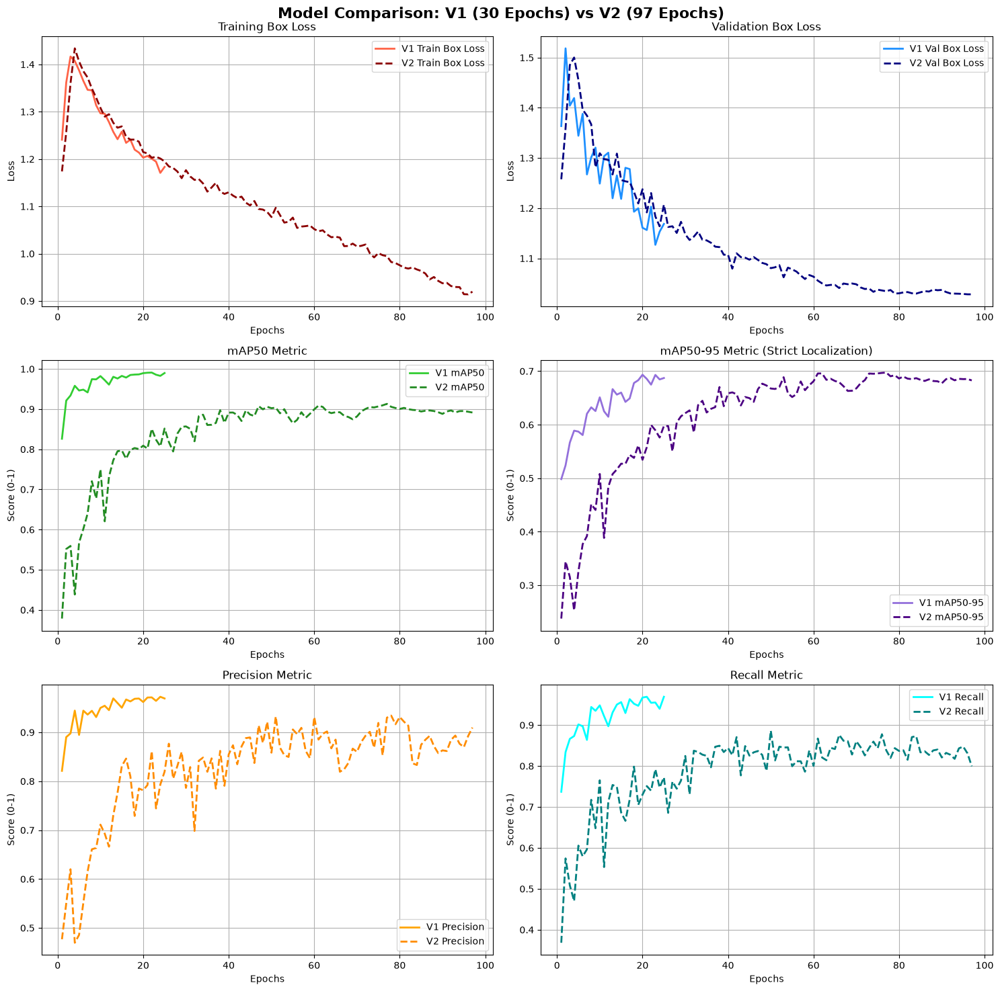

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the datasets
v1_df = pd.read_csv('../models/v1_model/results.csv')
v2_df = pd.read_csv('../models/v2_model/results.csv')

# Clean columns by stripping whitespace
v1_df.columns = [c.strip() for c in v1_df.columns]
v2_df.columns = [c.strip() for c in v2_df.columns]

# Create subplots
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
fig.suptitle("Model Comparison: V1 (25 Epochs) vs V2 (97 Epochs)", fontsize=16, fontweight='bold')

# 1. Plot Training Box Loss Comparison
axes[0, 0].plot(v1_df['epoch'], v1_df['train/box_loss'], label='V1 Train Box Loss', color='tomato', linewidth=2)
axes[0, 0].plot(v2_df['epoch'], v2_df['train/box_loss'], label='V2 Train Box Loss', color='darkred', linestyle='--', linewidth=2)
axes[0, 0].set_title("Training Box Loss")
axes[0, 0].set_xlabel("Epochs")
axes[0, 0].set_ylabel("Loss")
axes[0, 0].legend()
axes[0, 0].grid(True)

# 2. Plot Validation Box Loss Comparison
axes[0, 1].plot(v1_df['epoch'], v1_df['val/box_loss'], label='V1 Val Box Loss', color='dodgerblue', linewidth=2)
axes[0, 1].plot(v2_df['epoch'], v2_df['val/box_loss'], label='V2 Val Box Loss', color='navy', linestyle='--', linewidth=2)
axes[0, 1].set_title("Validation Box Loss")
axes[0, 1].set_xlabel("Epochs")
axes[0, 1].set_ylabel("Loss")
axes[0, 1].legend()
axes[0, 1].grid(True)

# 3. Plot mAP50 Comparison
axes[1, 0].plot(v1_df['epoch'], v1_df['metrics/mAP50(B)'], label='V1 mAP50', color='limegreen', linewidth=2)
axes[1, 0].plot(v2_df['epoch'], v2_df['metrics/mAP50(B)'], label='V2 mAP50', color='forestgreen', linestyle='--', linewidth=2)
axes[1, 0].set_title("mAP50 Metric")
axes[1, 0].set_xlabel("Epochs")
axes[1, 0].set_ylabel("Score (0-1)")
axes[1, 0].legend()
axes[1, 0].grid(True)

# 4. Plot mAP50-95 Comparison
axes[1, 1].plot(v1_df['epoch'], v1_df['metrics/mAP50-95(B)'], label='V1 mAP50-95', color='mediumpurple', linewidth=2)
axes[1, 1].plot(v2_df['epoch'], v2_df['metrics/mAP50-95(B)'], label='V2 mAP50-95', color='indigo', linestyle='--', linewidth=2)
axes[1, 1].set_title("mAP50-95 Metric (Strict Localization)")
axes[1, 1].set_xlabel("Epochs")
axes[1, 1].set_ylabel("Score (0-1)")
axes[1, 1].legend()
axes[1, 1].grid(True)

# 5. Plot Precision Comparison
axes[2, 0].plot(v1_df['epoch'], v1_df['metrics/precision(B)'], label='V1 Precision', color='orange', linewidth=2)
axes[2, 0].plot(v2_df['epoch'], v2_df['metrics/precision(B)'], label='V2 Precision', color='darkorange', linestyle='--', linewidth=2)
axes[2, 0].set_title("Precision Metric")
axes[2, 0].set_xlabel("Epochs")
axes[2, 0].set_ylabel("Score (0-1)")
axes[2, 0].legend()
axes[2, 0].grid(True)

# 6. Plot the Recall
axes[2, 1].plot(v1_df['epoch'], v1_df['metrics/recall(B)'], label='V1 Recall', color='cyan', linewidth=2)
axes[2, 1].plot(v2_df['epoch'], v2_df['metrics/recall(B)'], label='V2 Recall', color='teal', linestyle='--', linewidth=2)
axes[2, 1].set_title("Recall Metric")
axes[2, 1].set_xlabel("Epochs")
axes[2, 1].set_ylabel("Score (0-1)")
axes[2, 1].legend()
axes[2, 1].grid(True)

plt.tight_layout()
plt.savefig('model_comparison_plots.png', dpi=300)
plt.show()

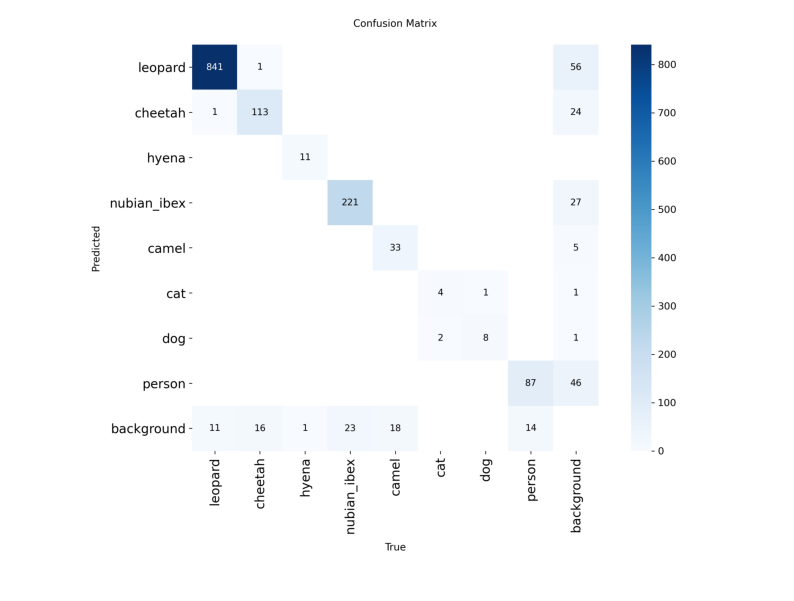

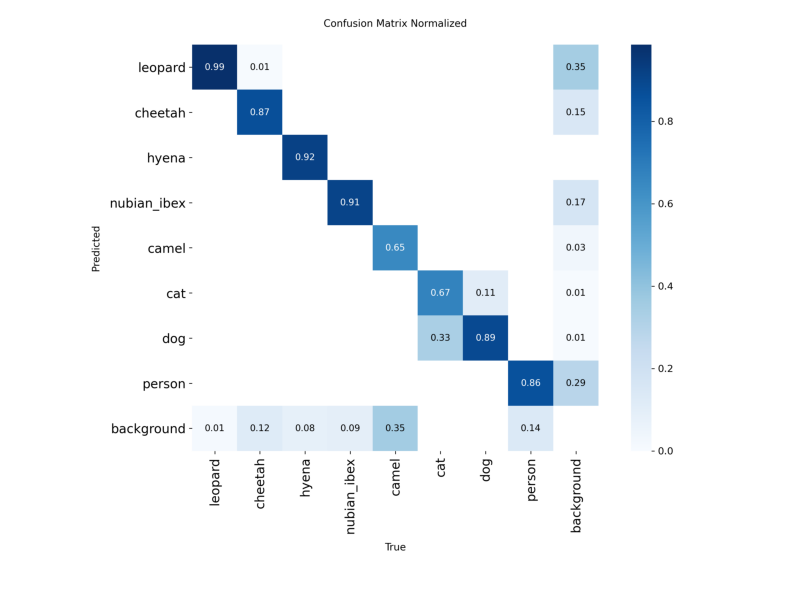

In [ ]:
import matplotlib.pyplot as plt

# 1. Show the standard Confusion Matrix (Raw counts)
plt.figure(figsize=(10, 10)) # Set image size
plt.imshow(plt.imread('../models/v2_model/v2_confusion_matrix.png'))
plt.axis('off') # Hide the scale / ticks completely
plt.show()

# 2. Show the Normalized Confusion Matrix (Proportions)
plt.figure(figsize=(10, 10)) # Set image size
plt.imshow(plt.imread('../models/v2_model/v2_confusion_matrix_normalized.png'))
plt.axis('off') # Hide the scale / ticks completely
plt.show()

In [ ]:
from ultralytics import YOLO

# Load your best V2 model weights
model = YOLO("../models/v2_model/weights/best.pt")

# Run validation explicitly with verbose=True
metrics = model.val(data='../data/v2_yolo_dataset/data.yaml',split='val', verbose=True)

# Print per-class precision, recall, and mAPs
for ci, name in enumerate(metrics.names.values()):
    print(f"Class: {name}")
    print(f"  Precision: {metrics.class_result(ci)[0]:.4f}")
    print(f"  Recall:    {metrics.class_result(ci)[1]:.4f}")
    print(f"  mAP50:     {metrics.class_result(ci)[2]:.4f}")
    print(f"  mAP50-95:  {metrics.class_result(ci)[3]:.4f}\n")

Ultralytics 8.4.84  Python-3.14.5 torch-2.12.1+cpu CPU (Intel Core Ultra 7 155H)
YOLO26n summary (fused): 122 layers, 2,376,396 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 2065.81005.0 MB/s, size: 508.1 KB)
val: Scanning C:\Users\Abdullah_Laptop\Desktop\KAUST SUMMER\Project\data\v2\valid\labels... 1212 images, 58 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1212/1212 2.3Kit/s 0.5s0.0s
val: New cache created: C:\Users\Abdullah_Laptop\Desktop\KAUST SUMMER\Project\data\v2\valid\labels.cache
WARNING Box and segment counts should be equal, but got len(segments) = 64, len(boxes) = 1406. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 76/76 1.6s/it 2:041.3sss
                   all       1212       1406      0.931       0.84  

## Quantize the model 
Try **int8** using both **tflite** and **onnx**

In [3]:
# Quantize the model
from ultralytics import YOLO 

trained_model = YOLO("../models/v2_model/weights/best.pt")

#save the quantized model in ONNX format with 8-bit quantization
trained_model.export(format="onnx", quantize=8, imgsz=128)  # dynamic ONNX with 8-bit quantization

Ultralytics 8.4.84  Python-3.14.5 torch-2.12.1+cpu CPU (Intel Core Ultra 7 155H)
WARNING INT8 export requires a missing 'data' arg for calibration. Using default 'data=coco8.yaml'.
YOLO26n summary (fused): 122 layers, 2,376,396 parameters, 0 gradients, 5.2 GFLOPs

PyTorch: starting from '..\models\v2_model\weights\best.pt' with input shape (1, 3, 128, 128) BCHW and output shape(s) (1, 300, 6) (5.2 MB)

ONNX: starting export with onnx 1.22.0 opset 20...
ONNX: slimming with onnxslim 0.1.94...


c:\Users\Abdullah_Laptop\Desktop\KAUST SUMMER\Hunting-Leopards-with-Half-Brain\venv\Lib\site-packages\torch\onnx\_internal\torchscript_exporter\symbolic_opset11.py:954: UserWarning: Exporting aten::index operator of advanced indexing in opset 20 is achieved by combination of multiple ONNX operators, including Reshape, Transpose, Concat, and Gather. If indices include negative values, the exported graph will produce incorrect results.
  return opset9.index(g, self, index)


ONNX: collecting INT8 calibration images from 'data=coco8.yaml'
val: Fast image access  (ping: 0.00.0 ms, read: 381.6226.1 MB/s, size: 54.0 KB)
val: Scanning C:\Users\Abdullah_Laptop\Desktop\KAUST SUMMER\Project\datasets\coco8\labels\val.cache... 4 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 4/4 1.0Mit/s 0.0s
WARNING ONNX: >300 images recommended for INT8 calibration, found 4 images.
ONNX: quantizing INT8 with ONNX Runtime...


ONNX: export success  5.9s, saved as '..\models\v2_model\weights\best_int8.onnx' (2.8 MB)

Export complete (6.1s)
Results saved to C:\Users\Abdullah_Laptop\Desktop\KAUST SUMMER\Hunting-Leopards-with-Half-Brain\models\v2_model\weights\best_int8.onnx
Predict:         yolo predict task=detect model=..\models\v2_model\weights\best_int8.onnx imgsz=128 
Validate:        yolo val task=detect model=..\models\v2_model\weights\best_int8.onnx imgsz=128 data=/content/data/data.yaml  
Visualize:       https://netron.app


'..\\models\\v2_model\\weights\\best_int8.onnx'

In [5]:
from ultralytics import YOLO
trained_model = YOLO("../models/v2_model/weights/best.pt")


# 1. Export dedicated 320x320 NCNN model
print("Exporting NCNN model for 320x320 resolution...")
trained_model.export(format="ncnn")  
# Generates a folder named: best_ncnn_model (renamed to best_ncnn_320)


Exporting NCNN model for 320x320 resolution...
Ultralytics 8.4.84  Python-3.14.5 torch-2.12.1+cpu CPU (Intel Core Ultra 7 155H)
WARNING NCNN export does not support end2end models, disabling end2end branch.
YOLO26n summary (fused): 146 layers, 2,497,424 parameters, 0 gradients, 5.2 GFLOPs

PyTorch: starting from '..\models\v2_model\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 12, 8400) (5.2 MB)

NCNN: starting export with NCNN 1.0.20260526 and PNNX 20260526...
NCNN: export success  4.2s, saved as '..\models\v2_model\weights\best_ncnn_model' (9.3 MB)

Export complete (4.5s)
Results saved to C:\Users\Abdullah_Laptop\Desktop\KAUST SUMMER\Hunting-Leopards-with-Half-Brain\models\v2_model\weights\best_ncnn_model
Predict:         yolo predict task=detect model=..\models\v2_model\weights\best_ncnn_model imgsz=640 
Validate:        yolo val task=detect model=..\models\v2_model\weights\best_ncnn_model imgsz=640 data=/content/data/data.yaml  
Visualize:       ht

'..\\models\\v2_model\\weights\\best_ncnn_model'

In [3]:
# 2. Export dedicated 256x256 NCNN model (ultra fast for low-power edge)
print("Exporting NCNN model for 256x256 resolution...")
trained_model.export(format="ncnn", imgsz=256)

Exporting NCNN model for 256x256 resolution...
Ultralytics 8.4.84  Python-3.14.5 torch-2.12.1+cpu CPU (Intel Core Ultra 7 155H)
WARNING NCNN export does not support end2end models, disabling end2end branch.
YOLO26n summary (fused): 146 layers, 2,497,424 parameters, 0 gradients, 5.2 GFLOPs

PyTorch: starting from '..\models\v2_model\weights\best.pt' with input shape (1, 3, 256, 256) BCHW and output shape(s) (1, 12, 1344) (5.2 MB)

NCNN: starting export with NCNN 1.0.20260526 and PNNX 20260526...
NCNN: export success  3.4s, saved as '..\models\v2_model\weights\best_ncnn_model' (9.2 MB)

Export complete (3.5s)
Results saved to C:\Users\Abdullah_Laptop\Desktop\KAUST SUMMER\Hunting-Leopards-with-Half-Brain\models\v2_model\weights\best_ncnn_model
Predict:         yolo predict task=detect model=..\models\v2_model\weights\best_ncnn_model imgsz=256 
Validate:        yolo val task=detect model=..\models\v2_model\weights\best_ncnn_model imgsz=256 data=/content/data/data.yaml  
Visualize:       ht

'..\\models\\v2_model\\weights\\best_ncnn_model'

In [ ]:
from ultralytics import YOLO
model = YOLO("../models/v2_model/weights/best.pt")

# run on rpi test/images folder
test_images_dir = "../data/v2_yolo_dataset/test/images"

results = model.predict(source=test_images_dir, save=True, conf=0.55, iou=0.45)

## Run the model From Camera

In [ ]:
from ultralytics import YOLO
import cv2
import time

# 1. Load the model
model_path = '../models/v2_model/weights/best.pt'
model = YOLO(model_path)

# 2. Start the webcam
cap = cv2.VideoCapture(0)

print("Webcam started. Press 'q' to quit.")

while cap.isOpened():
    success, frame = cap.read()
    if not success:
        print("Failed to grab frame from webcam.")
        break

    # --- LATENCY TRACKING START ---
    start_time = time.time()

    # 3. Run YOLO inference on the current frame
    results = model.predict(frame, conf=0.25, verbose=False)

    end_time = time.time()
    # Calculate overall latency in milliseconds
    latency_ms = (end_time - start_time) * 1000
    # --- LATENCY TRACKING END ---

    # 4. Extract detailed internal speeds from YOLO (optional but highly accurate)
    # YOLO breaks down speed into preprocess, inference, and postprocess keys
    yolo_speed = results[0].speed
    inference_ms = yolo_speed.get('inference', 0.0)

    # 5. Print the latency metrics to the terminal
    print(f"Total Step Latency: {latency_ms:.2f} ms | Pure Inference Latency: {inference_ms:.2f} ms")

    # 6. Visualize the results
    annotated_frame = results[0].plot()

    # Optional: Draw the latency directly onto the video frame window
    cv2.putText(
        annotated_frame, 
        f"Inference: {inference_ms:.1f}ms", 
        (10, 30), 
        cv2.FONT_HERSHEY_SIMPLEX, 
        1, 
        (0, 255, 0), 
        2, 
        cv2.LINE_AA
    )

    # 7. Display the frame in a window
    cv2.imshow("Leopard Detector - Live Test", annotated_frame)

    # 8. Break the loop if the 'q' key is pressed
    if cv2.waitKey(1) & 0xFF == ord("q"):
        break

# Clean up
cap.release()
cv2.destroyAllWindows()